In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

### generadores

In [2]:
# usamos un generador que devulve objeto iterable y con next nos devuelve uno a uno (se usa para ahorrar recursos ya que no genera la lista entera sino uno a uno medida que se lo pides)
def generador(limite):
    num = 1
    while num<limite:
        yield num*2
        num = 1+num

In [3]:
devuelvePares1 = generador(10)

ojo una vez que se ha vaciado la lista no se puede volver a iterar
https://stackoverflow.com/questions/14413969/why-does-next-raise-a-stopiteration-but-for-do-a-normal-return

https://es.stackoverflow.com/questions/6048/cu%C3%A1l-es-el-funcionamiento-de-yield-en-python

In [4]:
print(next(devuelvePares1))
print("el primer numero")
print(next(devuelvePares1))
print("el segundo numero")

2
el primer numero
4
el segundo numero


In [5]:
# generado en bucles anidados (ej for for)
def devuelve_ciudades(*ciudades): 
    # cuando usamos asterisco decimos a python que no sabemos cuantos elementos van a ser los   argumentos, y que se van a organizar en tuplas
    for elemento in ciudades:
        yield from elemento #nos devuelve el primer elemento del primer elemento

In [6]:
ciudades_devueltas = devuelve_ciudades("Madrid","barcelona","valencia")
print(next(ciudades_devueltas))
print(next(ciudades_devueltas))

M
a


### captura o control de excepciones
hay veces que un programa esta bien escrito , sin ningun fallo, y aun asi da error (pensemos en una simple calculadora donde introducimos dividir por 0, esto nos devuelve un error porque no se puede)

ver TRY, EXCEPT, RAISE,FINALLY

### POO (CLASES, PROGRAMACION ORIENTADO OBJETO)

In [7]:
class Coche():
    # creamos un constructor , son los atributos // propiedades de inicio
    def __init__(self):
        self.largoChasis=250
        self.anchoChasis=120
        self.ruedas=4
        self.enmarcha=False
    #comportamiento (a traves de: metodos, funcion que pertence a una clase)
    # self hace ref a un objeto pertenciente a la clase
    def arrancar(self,arrancamos):# esto no es una funcion es un metodo ¡
        self.enmarcha = arrancamos

        if(self.enmarcha):
            chequeo = self.__chequeo_interno()

        if(self.enmarcha and chequeo):
            return "el coche esta en marcha"
        elif(self.enmarcha and chequeo == False):
            return "Algo ha ido mal en el chequeo"
        else:
            return "el coche esta parado"

    
    def estado(self):
        print("el coche tiene", self.ruedas, " ruedas. Un ancho de ", self.anchoChasis, " y un largo de ", self.largoChasis)

    def __chequeo_interno(self):# con dos lineas encapsulamos el metodo(solo se ejecuta dentro de la clase)
        print("realizando chequeo interno")
        self.gasolina = "ok"
        self.aceite = "ok"
        self.puertas = "cerradas"

        if(self.gasolina == "ok" and self.aceite == "ok" and self.puertas == "cerradas"):
            return True
        else:
            return False

#instanciar una clase (creamos un objeto)
miCoche=Coche()

In [8]:
print(f"el largo del coche es {miCoche.largoChasis}")

el largo del coche es 250


In [9]:
miCoche.arrancar(True)  # esto es lo mismo que decir self.enmarcha = True // self = miCoche

realizando chequeo interno


'el coche esta en marcha'

In [10]:
print(miCoche.estado())

el coche tiene 4  ruedas. Un ancho de  120  y un largo de  250
None


In [11]:
# creamos el segundo objeto
miCoche2 = Coche()
print(f"el largo del coche es {miCoche2.largoChasis}")
print(f"el coche tiene {miCoche2.ruedas} ruedas")

el largo del coche es 250
el coche tiene 4 ruedas


In [12]:
print(miCoche2.estado())

el coche tiene 4  ruedas. Un ancho de  120  y un largo de  250
None


In [13]:
miCoche2.arrancar(False)

'el coche esta parado'

### herencias

In [14]:
class Vehiculos():

    # constructor
    def __init__(self,marca,modelo):
        self.marca = marca
        self.modelo = modelo
        self.enmarcha = False
        self.acelera = False
        self.frena = False
    # definimos comportamientos
    def arrancar(self):
        self.enmarcha = True
    
    def acelerar(self):
        self.acelera

    def frenar(self):
        self.frena = True

    def estado(self):
        print("Marca ", self.marca, "\nModelo: ",self.modelo, "\nEn marcha: ",self.enmarcha,
        "\nAcelerando: ",self.acelera, "\nFrenando: ",self.frena) 


In [15]:
# creamos una clase moto que hereda las caracteristicas de vehiculo
class Moto(Vehiculos):
    hcaballito=""
    def caballito(self):
        self.hcaballito ="Voy haciendo el caballito"
    def estado(self):
        print("Marca ", self.marca, "\nModelo: ",self.modelo, "\nEn marcha: ",self.enmarcha  \
                ,"\nAcelerando: ",self.acelera, "\nFrenando: ",self.frena,"\n",self.hcaballito) 

    

In [16]:
# creamos una instancia y vemos que hereda las caracteristicas de vehiculo
miMoto=Moto("Honda","CBR")
miMoto.caballito()
miMoto.estado()

Marca  Honda 
Modelo:  CBR 
En marcha:  False 
Acelerando:  False 
Frenando:  False 
 Voy haciendo el caballito


In [17]:
class Furgoneta(Vehiculos):
    def carga(self,cargar):
        self.cargado = cargar
        if (self.cargado):
            return "La furgoneta esta cargada"
        else:
            return "la furgoneta no esta cargada"

In [18]:
miFurgoneta = Furgoneta("Renault","Kangoo")
miFurgoneta.arrancar()
miFurgoneta.estado()
miFurgoneta.carga(True)

Marca  Renault 
Modelo:  Kangoo 
En marcha:  True 
Acelerando:  False 
Frenando:  False


'La furgoneta esta cargada'

In [19]:
class VElectricos():
    def __init__(self):
        self.autonomia=100
    def cargarEnergia(self):
        self.cargando=True
# ahora vemos una herencia multiple (aqui se da preferencia a la primera clase; si hacemos al reves no podemos poner marca ni modelo)
class BicicletaElectrica(Vehiculos,VElectricos):
    pass

In [20]:
miBici = BicicletaElectrica("Orbea","HC12")

In [21]:
miBici.estado()

Marca  Orbea 
Modelo:  HC12 
En marcha:  False 
Acelerando:  False 
Frenando:  False


In [30]:
# funcion super()
class Persona():

    def __init__(self,nombre,edad,lugar_residencia):

        self.nombre = nombre
        self.edad = edad
        self.lugar_residencia = lugar_residencia

    def descripcion(self):
        print("Nombre: ",self.nombre," Edad:",self.edad," Lugar: ",self.lugar_residencia)
# clase que hereda de otra
class Empleado(Persona):
    
    def __init__(self, salario, antiguedad,nombre_empleado,edad_empleado,residencia_empleado):
        self.salario = salario
        self.antiguedad = antiguedad
        # ahora con super() traemos cualquier cosa de la clase padre (aqui init)
        super().__init__(nombre_empleado,edad_empleado,residencia_empleado)
        self.salario = salario
        self.antiguedad = antiguedad
    
    def descripcion(self):
        super().descripcion() # aqui con super traemos el metodo descripcion
        print("Salario: ",self.salario," Antiguedad: ",self.antiguedad)


In [26]:
# creamos una instancia
Antonio = Persona("Antonio",55,"España")
Antonio.descripcion()

Nombre:  Antonio  Edad: 55  Lugar:  España


In [31]:
Manuel = Empleado(1500,5,"Manuel",45,"España")
Manuel.descripcion()

Nombre:  Manuel  Edad: 45  Lugar:  España
Salario:  1500  Antiguedad:  5


In [32]:
# cuando no tenemos claro si es una instancia o a que clase pertenece
print(isinstance(Manuel,Empleado))

True


In [33]:
print(isinstance(Manuel,Persona))

True


In [3]:
path = r"C:\Users\gonza\OneDrive\Documentos\Master IFM\Modulo 1 Python\Sintaxis_Python_ipynb\AAPL.csv"
df = pd.read_csv(path)
df.head(3)

,Date,Open,High,Low,Close,Volume,Adj Close
0,2000-03-01,118.56,132.06,118.50,130.31,38478000,31.68
1,2000-03-02,127.00,127.94,120.69,122.00,11136800,29.66
2,2000-03-03,124.87,128.23,120.00,128.00,11565200,31.12


(array([1602.,  573.,  346.,  145.,  193.,  133.,   44.,   80.,  115.,
          39.]),
 array([ 12.72 ,  81.405, 150.09 , 218.775, 287.46 , 356.145, 424.83 ,
        493.515, 562.2  , 630.885, 699.57 ]),
 <a list of 10 Patch objects>)

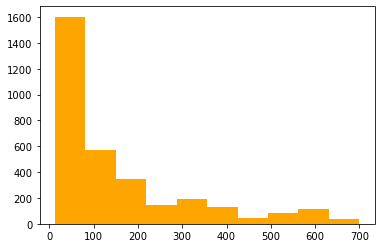

In [21]:
plt.hist(df.Low,color="orange")

array([<matplotlib.axes._subplots.AxesSubplot object at 0x00000213C3DBE8B0>,
      dtype=object)

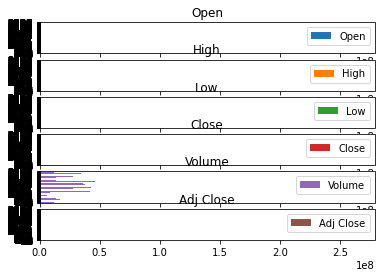

In [23]:
df.plot(kind="barh", subplots=True)

<BarContainer object of 5 artists>

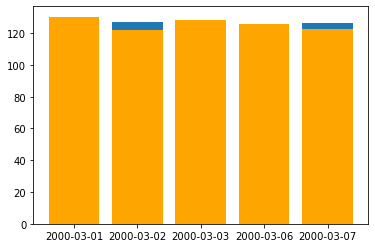

In [10]:
cinco = df.head(5)
plt.bar(x=cinco.Date,height=cinco.Open)
plt.bar(x=cinco.Date,height=cinco.Close,color="orange")

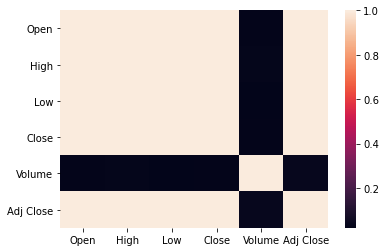

In [12]:
import seaborn as sns
coor = df.corr()
sns.heatmap(coor)

In [13]:
coor

,Open,High,Low,Close,Volume,Adj Close
Open,1.000000,0.999912,0.999865,0.999768,0.025638,0.996358
High,0.999912,1.000000,0.999840,0.999893,0.028510,0.996325
Low,0.999865,0.999840,1.000000,0.999882,0.020534,0.996577
Close,0.999768,0.999893,0.999882,1.000000,0.024636,0.996564
Volume,0.025638,0.028510,0.020534,0.024636,1.000000,0.036967
Adj Close,0.996358,0.996325,0.996577,0.996564,0.036967,1.000000


In [14]:
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import LinearColorMapper, ColorBar
from bokeh.transform import transform
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.transform import factor_cmap
from bokeh.palettes import Spectral5

output_notebook()

Loading BokehJS ...

In [19]:
correct_dates = pd.to_datetime(df.Date)
p = figure(plot_width=600, plot_height=300, title='Transformacione',x_axis_type="datetime")
p.line(correct_dates,df.Low)
show(p)

In [25]:
x = np.random.rand(100)

In [31]:

p = figure(plot_width=600, plot_height=300, title='histogram')
p.quad(p)
show(p)

ValueError: expected an element of either String, Dict(Enum('expr', 'field', 'value', 'transform'), Either(String, Instance(Transform), Instance(Expression), Float)) or Float, got Figure(id='1822', ...)